In [1]:
import torch
import numpy as np
import random

from utils.loader import get_loaders

random_seed = 2024  # 시드(seed) 고정
torch.manual_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"current device: {device}")

train_loader, test_loader, valid_loader = get_loaders()

print("loading complete 🔥")

current device: cuda
Running in local environment, data path is ./data
dataset.zip already exists.
dataset.zip is already unzipped at ./data/dataset
loading complete 🔥


In [2]:
import torchvision.models as models
import torch.nn as nn

def setup_model_fc(model):
    model.classifier = nn.Sequential(
        nn.Linear(in_features=model.last_channel, out_features=6, bias=True),  # 추가된 중간 레이어
    ).to(device)

model = models.mobilenet_v2(pretrained=True).to(device)

setup_model_fc(model)

for param in model.parameters():
    param.requires_grad = True # 모든 파라미터를 학습

# Ensure the final layer's parameters require gradients
for param in model.classifier.parameters():
    param.requires_grad = True

print("model setup completed")


/home/jinho/work/jinho/venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jinho/work/jinho/venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


model setup completed


In [3]:
from utils.EarlyStopping import *
from utils.LRScheduler import *


# 하이퍼 파라미터 설정
class Parameters:
    def __init__(self):
        self.description = "MobileNet for Image Classification"
        # 에포크 수
        self.epochs = 50
        # 배치 크기
        self.batch_size = 16
        # 학습률
        self.learning_rate = 1e-4  # 0.0001
        # 훈련된 모델 경로
        self.model_name = "Mobilenet"


args = Parameters()

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

early_stopping = EarlyStopping(patience=7, min_delta=1e-5)

scheduler = LRScheduler(optimizer=optimizer, patience=5, min_lr=1e-10, factor=0.5)

/home/jinho/work/jinho/venv/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [5]:
from utils.train_eval_util import evaluate, train

# best_valid_loss = float('inf')

# # 학습률 스케줄러 정의
# train_losses = []
# valid_losses = []

# for epoch in range(args.epochs):
#     train_loss = train(model, train_loader, optimizer, criterion, device)
#     valid_loss, valid_acc, _, _ = evaluate(model, valid_loader, criterion, device)
#     train_losses.append(train_loss)
#     valid_losses.append(valid_loss)
#     print(f"Epoch [{epoch+1}/{args.epochs}], Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Valid Acc: {valid_acc:.4f}")

#     scheduler(valid_loss)

#     if (early_stopping(valid_loss)):
#         print("early stopped! ⚡️")
#         break

#     if valid_loss < best_valid_loss:
#         best_valid_loss = valid_loss
#         epochs_no_improve = 0
#         torch.save(model.state_dict(), f"./{args.model_name}.pth")

/tmp/ipykernel_171161/534960337.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("./Mobilenet_128_0.0001.pth"))


Train Loss: 0.0350, Train Acc: 0.9909
Valid Loss: 0.1384, Valid Acc: 0.9579
Test Loss: 0.1124, Test Acc: 0.9726


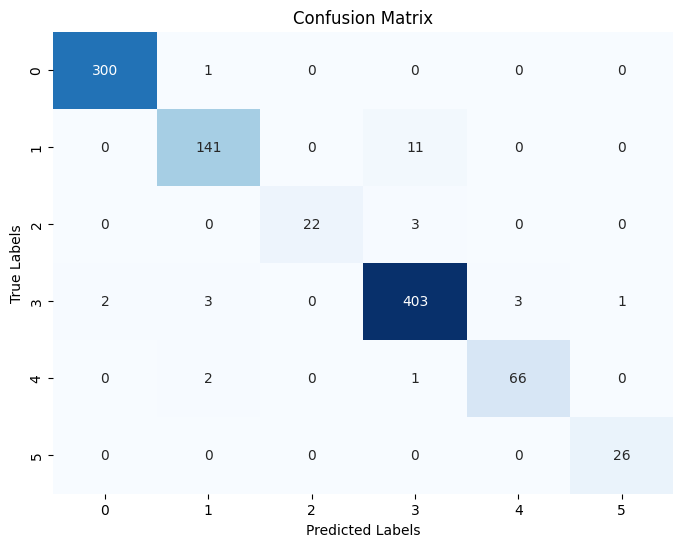

In [6]:
# 저장된 모델 로드
import torchvision.models as models
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

model = models.mobilenet_v2(pretrained=True).to(device)

setup_model_fc(model)

model.load_state_dict(torch.load("./Mobilenet_128_0.0001.pth"))

# train 세트 평가
train_loss, train_acc, train_preds, train_labels = evaluate(model, train_loader, criterion, device)
print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")

# valid 세트 평가
valid_loss, valid_acc, valid_preds, valid_labels = evaluate(model, valid_loader, criterion, device)
print(f"Valid Loss: {valid_loss:.4f}, Valid Acc: {valid_acc:.4f}")

# test 세트 평가
test_loss, test_acc, test_preds, test_labels = evaluate(model, test_loader, criterion, device)
print(f"Test Loss: {test_loss:.4f}, Test Acc: {test_acc:.4f}")

# Confusion Matrix 계산
conf_matrix = confusion_matrix(test_labels, test_preds)

# Confusion Matrix 그리기
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False,
            xticklabels=np.array(list(range(0, 6))), yticklabels=np.array(list(range(0, 6))))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

/home/jinho/work/jinho/venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jinho/work/jinho/venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_171161/1263239215.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/ma

[tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([0], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1], device='cuda:0'), tensor([1

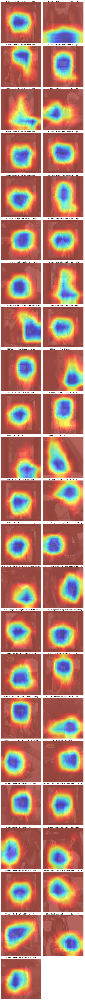

2024-12-07 17:45:04
Test Loss: 2.0851, Test Acc: 0.3333
[np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(0), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(0), np.int64(1), np.int64(1), np.int64(1), np.int64(0), np.int64(1), np.int64(0), np.int64(1)]


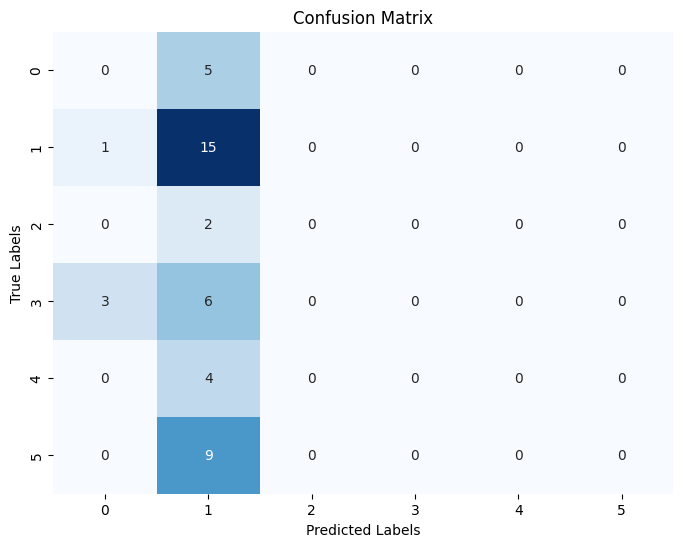

In [ ]:
import math
from pytorch_grad_cam import GradCAM, EigenCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torchvision.models as models
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

from utils.loader import get_test_loaders

model = models.mobilenet_v2(pretrained=True).to(device)
setup_model_fc(model)
model.load_state_dict(torch.load("./Mobilenet_128_0.0001.pth"))

model.eval()

def apply_gradcam(model, images, targets, cam_algorithm):
    # GradCAM을 적용하여 CAM을 얻는 함수
    grayscale_cams = cam_algorithm(input_tensor=images, targets=targets)
    return grayscale_cams

real_test_loader = get_test_loaders()

# DataLoader에서 이미지와 레이블을 추출
images_list = []
labels_list = []
predictions_list = []

for i, (images, labels) in enumerate(real_test_loader):
    images_list.append(images)
    labels_list.append(labels)

    with torch.no_grad():
        outputs = model(images.to(device))
        _, predicted = torch.max(outputs, 1)
        predictions_list.append(predicted)
    
# 모델을 평가 모드로 설정
model.eval()

# TODO: target layer 수정 필요!!!!!!!!
target_layers = [model.features[-1]]  # 마지막 레이어를 타겟 레이어로 설정
cam = EigenCAM(model=model, target_layers=target_layers)

# 리스트 평탄화
images_list = torch.cat(images_list)
labels_list = torch.cat(labels_list)
predictions_list = torch.cat(predictions_list)

# 표시할 이미지 수
num_images = len(real_test_loader) # 전체는 images_list.size(0)
num_cols = 2 
num_rows = math.ceil(num_images / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 6, num_rows * 6))
axes = axes.flatten()

categories = [
    "DangerousDriving", # 0
    "Distracted", # 1
    "Drinking", # 2
    "SafeDriving", # 3
    "SleepyDriving", # 4
    "Yawn" # 5
]

# 미리 추출한 이미지, 레이블, 예측을 반복합니다.
for idx in range(num_images):
    images = images_list[idx].unsqueeze(0)
    labels = labels_list[idx]
    predicted = predictions_list[idx]

    # 현재 이미지의 예측 레이블 입력
    targets = [ClassifierOutputTarget(predicted.item())]

    # GradCAM을 적용
    grayscale_cam = apply_gradcam(model, images, targets, cam)
    grayscale_cam = grayscale_cam[0, :]  # 배치 차원 제거

    # 이미지를 원래 형태로 변환
    image_denormalized = images_list[idx] * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    rgb_img = image_denormalized.permute(1, 2, 0).numpy()  # (C, H, W) -> (H, W, C)

    # 결과 시각화
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)

    ax = axes[idx]
    ax.imshow(visualization)
    true_label_name = categories[labels.item()]
    print(predicted.item())
    predicted_label_name = categories[predicted.item()]
    ax.set_title(f"#{idx} {true_label_name} & {predicted_label_name} / {'Right' if true_label_name == predicted_label_name else 'Wrong'}", fontsize=14)
    ax.axis('off')

for idx in range(num_images, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

# 현재 시간 출력
import datetime
now = datetime.datetime.now()
now = now + datetime.timedelta(hours=9)
now = now.strftime('%Y-%m-%d %H:%M:%S')
print(now)

# test 세트 평가
test_loss, test_acc, test_preds, test_labels = evaluate(model, real_test_loader, criterion, device)
print(f"Test Loss: {test_loss:.4f}, Test Acc: {test_acc:.4f}")

# Confusion Matrix 계산
conf_matrix = confusion_matrix(test_labels, test_preds)
print(test_preds)

# Confusion Matrix 그리기
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False,
            xticklabels=np.array(list(range(0, 6))), yticklabels=np.array(list(range(0, 6))))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()